# Autotalker Tutorial

- **Creator**: Sebastian Birk (<sebastian.birk@helmholtz-munich.de>).
- **Affiliation:** Helmholtz Munich, Institute of Computational Biology (ICB), Talavera-López Lab
- **Date of Creation:** 07.12.2022
- **Date of Last Modification:** 14.12.2022

## 1. Setup

### 1.1 Import Libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")

In [3]:
import argparse
import os
import random
import warnings
from copy import deepcopy
from datetime import datetime

import anndata as ad
import matplotlib
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as sp
import seaborn as sns
import squidpy as sq
import torch
from matplotlib.pyplot import rc_context

from autotalker.models import Autotalker
from autotalker.utils import (add_gps_from_gp_dict_to_adata,
                              extract_gp_dict_from_mebocost_es_interactions,
                              extract_gp_dict_from_nichenet_ligand_target_mx,
                              extract_gp_dict_from_omnipath_lr_interactions,
                              filter_and_combine_gp_dict_gps)

### 1.2 Define Parameters

In [131]:
## Dataset
dataset = "squidpy_seqfish_mouse_organogenesis"
#dataset = "squidpy_slideseqv2_mouse_hippocampus"
#dataset = "vizgen_merfish_mouse_brain"
#dataset = "vizgen_merfish_mouse_liver" 
#dataset = "vizgen_merfish_human_liver_cancer"
#dataset = "10x_xenium_human_breast_cancer"
#dataset = "starmap_plus_mouse_cns"
#dataset = "eel_fish_mouse_brain"
radius = 0.05102 # for spatial neighborhood graph (8 neighbors on average)

## Model
# AnnData Keys
counts_key = "counts"
cell_type_key = "celltype_mapped_refined"
adj_key = "spatial_connectivities"
spatial_key = "spatial"
gp_names_key = "autotalker_gp_names"
active_gp_names_key = "autotalker_active_gp_names"
gp_targets_mask_key = "autotalker_gp_targets"
gp_sources_mask_key = "autotalker_gp_sources"
latent_key = "autotalker_latent"

# Architecture
active_gp_thresh_ratio = 0

# Trainer
n_epochs = 10
n_epochs_all_gps = 2
lr = 0.01
lambda_l1_addon = 0.1

## Others
random_seed = 42

### 1.3 Run Notebook Setup

In [7]:
# Ignore future warnings and user warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [8]:
# Get time of notebook execution for timestamping saved artifacts
now = datetime.now()
current_timestamp = now.strftime("%d%m%Y_%H%M%S")

### 1.4 Configure Paths and Create Directories

In [5]:
# Define paths
figure_path = f"../figures/{dataset}/analysis/{current_timestamp}"
model_artifacts_path = f"../model_artifacts/{dataset}/analysis"
gp_data_folder_path = "../datasets/gp_data" # gene program data
srt_data_folder_path = "../datasets/srt_data" # spatially resolved transcriptomics data
srt_data_gold_folder_path = f"{srt_data_folder_path}/gold"
nichenet_ligand_target_mx_file_path = gp_data_folder_path + "nichenet_ligand_target_matrix.csv"
omnipath_lr_interactions_file_path = gp_data_folder_path + "omnipath_lr_interactions.csv"

# Create required directories
os.makedirs(figure_path, exist_ok=True)
os.makedirs(model_artifacts_path, exist_ok=True)

## 2. Data

### 2.1 Load Data & Compute Spatial Neighbor Graph

In [9]:
adata = ad.read_h5ad(f"{srt_data_gold_folder_path}/{dataset}.h5ad")

# Compute spatial neighborhood
sq.gr.spatial_neighbors(adata,
                        coord_type="generic",
                        spatial_key=spatial_key,
                        radius=radius)

### 2.2 Explore Data

Using dataset squidpy_seqfish_mouse_organogenesis.
Number of nodes (cells): 19416
Number of node features (genes): 351


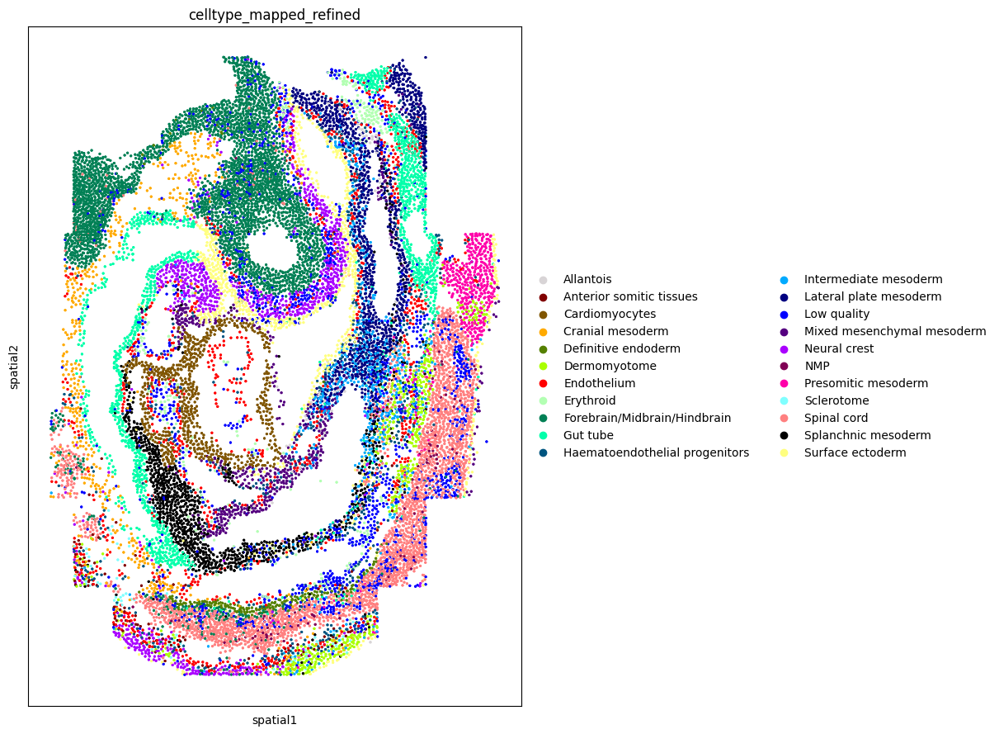

In [10]:
print(f"Using dataset {dataset}.")
print(f"Number of nodes (cells): {adata.layers['counts'].shape[0]}")
print(f"Number of node features (genes): {adata.layers['counts'].shape[1]}")

# Visualize cell-level annotated data in spatial space
sq.pl.spatial_scatter(adata, color=cell_type_key, shape=None, figsize=(12, 12))

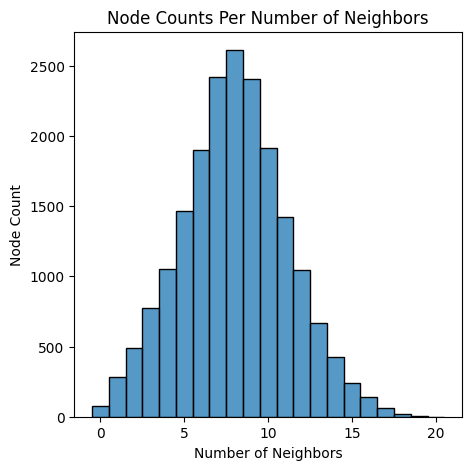

Average number of edges per node: 8.0.
Number of total edges: 77668.


In [11]:
# Plot histogram of node counts per number of neighbors
ax = sns.histplot(np.squeeze(np.asarray(adata.obsp['spatial_connectivities'].sum(axis=0))),
                  discrete=True)
ax.set_title("Node Counts Per Number of Neighbors")
ax.set_ylabel("Node Count")
ax.set_xlabel("Number of Neighbors")
fig = ax.figure
fig.savefig(f"{figure_path}/{current_timestamp}/node_counts_per_n_neighs.png",
            bbox_inches="tight")
plt.show()

avg_edges_per_node = round(adata.obsp['spatial_connectivities'].sum(axis=0).mean(), 2)
print(f"Average number of edges per node: {avg_edges_per_node}.")
n_edges = int(sp.triu(adata.obsp['spatial_connectivities'], k=1).sum())
print(f"Number of total edges: {n_edges}.")

## 3. Train Autotalker Model with Prior Knowledge Cell-Cell-Interaction (CCI) Gene Programs (GPs)

### 3.1 Create Prior Knowledge CCI GP Mask

In [12]:
nichenet_gp_dict = extract_gp_dict_from_nichenet_ligand_target_mx(
    keep_target_ratio=0.01,
    load_from_disk=False,
    save_to_disk=True,
    file_path=nichenet_ligand_target_mx_file_path)

In [13]:
omnipath_gp_dict = extract_gp_dict_from_omnipath_lr_interactions(
    min_curation_effort=0,
    load_from_disk=False,
    save_to_disk=True,
    file_path=omnipath_lr_interactions_file_path)

In [14]:
mebocost_gp_dict = extract_gp_dict_from_mebocost_es_interactions(
    dir_path=f"{gp_data_folder_path}/metabolite_enzyme_sensor_gps/",
    species="mouse",
    genes_uppercase=True)

In [15]:
# Combine gene programs into one dictionary
combined_gp_dict = dict(nichenet_gp_dict)
combined_gp_dict.update(omnipath_gp_dict)
combined_gp_dict.update(mebocost_gp_dict)

In [16]:
# Filter and combine gene programs
combined_new_gp_dict = filter_and_combine_gp_dict_gps(
    gp_dict=combined_gp_dict,
    gp_filter_mode="subset", #None,
    combine_overlap_gps=True, #True,
    overlap_thresh_source_genes=0.9,
    overlap_thresh_target_genes=0.9,
    overlap_thresh_genes=0.9,
    verbose=True)

print(f"Number of gene programs before filtering and combining: {len(combined_gp_dict)}.")
print(f"Number of gene programs after filtering and combining: {len(combined_new_gp_dict)}.")

Removing GP 'CTF1_ligand_receptor_GP' as it is a subset of GP 'CTF1_ligand_targetgenes_GP'.
Removing GP 'LEP_ligand_receptor_GP' as it is a subset of GP 'LEP_ligand_targetgenes_GP'.
Removing GP 'IL4_ligand_receptor_GP' as it is a subset of GP 'IL4_ligand_targetgenes_GP'.
Removing GP 'IL12A_ligand_receptor_GP' as it is a subset of GP 'IL12A_ligand_targetgenes_GP'.
Removing GP 'IL23A_ligand_receptor_GP' as it is a subset of GP 'IL23A_ligand_targetgenes_GP'.
Removing GP 'CSF2_ligand_receptor_GP' as it is a subset of GP 'CSF2_ligand_targetgenes_GP'.
Removing GP 'IL21_ligand_receptor_GP' as it is a subset of GP 'IL21_ligand_targetgenes_GP'.
Removing GP 'TSLP_ligand_receptor_GP' as it is a subset of GP 'TSLP_ligand_targetgenes_GP'.
Removing GP 'GH2_ligand_receptor_GP' as it is a subset of GP 'GH2_ligand_targetgenes_GP'.
Removing GP 'EGF_ligand_receptor_GP' as it is a subset of GP 'EGF_ligand_targetgenes_GP'.
Removing GP 'IL10_ligand_receptor_GP' as it is a subset of GP 'IL10_ligand_targetgen

In [22]:
# Add the gene program dictionary as binary masks to the adata for model training
add_gps_from_gp_dict_to_adata(
    gp_dict=combined_new_gp_dict,
    adata=adata,
    genes_uppercase=True,
    gp_targets_mask_key=gp_targets_mask_key,
    gp_sources_mask_key=gp_sources_mask_key,
    gp_names_key=gp_names_key,
    min_genes_per_gp=1,
    min_source_genes_per_gp=0,
    min_target_genes_per_gp=0,
    max_genes_per_gp=None,
    max_source_genes_per_gp=None,
    max_target_genes_per_gp=None)

# Determine dimensionality of hidden encoder
n_hidden_encoder = len(adata.uns[gp_names_key])

In [23]:
# Summarize gene programs
print(f"Number of gene programs with probed genes: {len(adata.uns['autotalker_gp_names'])}.")
print(f"Example gene programs: {random.sample(list(adata.uns['autotalker_gp_names']), 5)}.")
print(f"Number of gene program target genes: {adata.varm['autotalker_gp_targets'].sum()}.")
print(f"Number of gene program source genes: {adata.varm['autotalker_gp_sources'].sum()}.")

Number of gene programs with probed genes: 489.
Example gene programs: ['IL7_ligand_targetgenes_GP', 'SFRP5_ligand_receptor_GP', 'APP_ligand_targetgenes_GP', 'ALCAM_ligand_targetgenes_GP', 'PGF_ligand_targetgenes_GP'].
Number of gene program target genes: 7476.
Number of gene program source genes: 127.


### 3.2 Initialize, Train & Save Model

In [24]:
# Initialize model
model = Autotalker(adata,
                   counts_key=counts_key,
                   adj_key=adj_key,
                   gp_names_key=gp_names_key,
                   active_gp_names_key=active_gp_names_key,
                   gp_targets_mask_key=gp_targets_mask_key,
                   gp_sources_mask_key=gp_sources_mask_key,
                   latent_key=latent_key,
                   active_gp_thresh_ratio=active_gp_thresh_ratio,
                   n_hidden_encoder=n_hidden_encoder,
                   n_addon_gps=0)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 489, n_latent: 489, n_addon_latent: 0, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 489, n_addon_input: 0, n_output: 702


In [25]:
# Train model
model.train(n_epochs=n_epochs,
            n_epochs_all_gps=n_epochs_all_gps,
            lr=lr)

--- INITIALIZING TRAINER ---
Number of training nodes: 17474
Number of validation nodes: 1942
Number of test nodes: 0
Number of training edges: 66019
Number of validation edges: 7766
Number of test edges: 3883

--- MODEL TRAINING ---
Epoch 1/10 |██------------------| 10.0% train_global_loss: 486.8157; train_optim_loss: 486.8157; val_global_loss: 480.4156; val_optim_loss: 480.4156
Epoch 2/10 |████----------------| 20.0% train_global_loss: 476.7387; train_optim_loss: 476.7387; val_global_loss: 479.5187; val_optim_loss: 479.5187
Epoch 3/10 |██████--------------| 30.0% train_global_loss: 477.3443; train_optim_loss: 477.3443; val_global_loss: 481.4419; val_optim_loss: 481.4419
Epoch 4/10 |████████------------| 40.0% train_global_loss: 478.2743; train_optim_loss: 478.2743; val_global_loss: 481.0526; val_optim_loss: 481.0526
Epoch 5/10 |██████████----------| 50.0% train_global_loss: 478.0467; train_optim_loss: 478.0467; val_global_loss: 480.4643; val_optim_loss: 480.4643
Epoch 6/10 |█████████

In [26]:
# Save trained model
model.save(dir_path=f"../model_artifacts/{dataset}/analysis/autotalker_combined_gps_{current_timestamp}",
           overwrite=True,
           save_adata=True,
           adata_file_name=f"{dataset}.h5ad")

## 4. Analysis

In [27]:
# Load trained model
model = Autotalker.load(dir_path=f"../model_artifacts/{dataset}/analysis/autotalker_combined_gps_{current_timestamp}",
                        adata=None,
                        adata_file_name=f"{dataset}.h5ad",
                        gp_names_key="autotalker_gp_names")

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 489, n_latent: 489, n_addon_latent: 0, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 489, n_addon_input: 0, n_output: 702


In [28]:
# Check number of active gene programs
active_gps = model.get_active_gps()
print(f"Number of total gene programs: {len(model.adata.uns[gp_names_key])}.")
print(f"Number of active gene programs: {len(active_gps)}.")

Number of total gene programs: 489.
Number of active gene programs: 489.


In [29]:
# Use autotalker latent space for UMAP generation
sc.pp.neighbors(model.adata, use_rep=latent_key)
sc.tl.umap(model.adata, min_dist=0.3)

### 4.1 Cell-type Annotations in Spatial and Latent Space

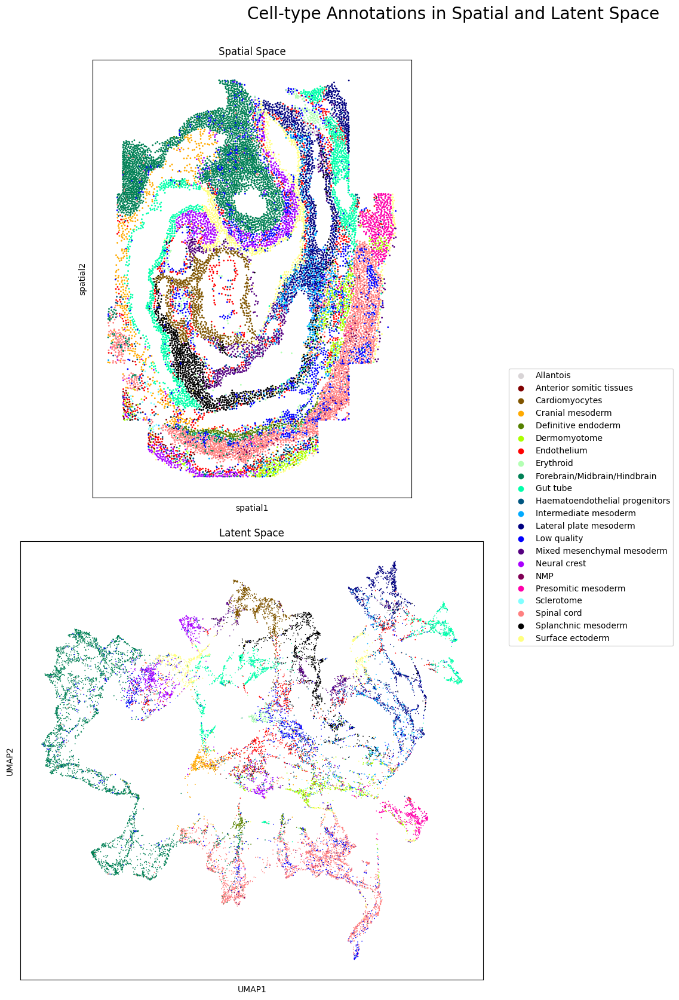

In [30]:
# Create subplot of cell-type annotations in physical and latent space
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 20))
title = fig.suptitle(t="Cell-type Annotations in Spatial and Latent Space",
                     x=0.85,
                     y=0.925,
                     fontsize=20)
sc.pl.spatial(adata=model.adata,
              color=[cell_type_key],
              spot_size=0.03,
              title="Spatial Space",
              ax=axs[0],
              show=False)
sc.pl.umap(adata=model.adata,
           color=[cell_type_key],
           title="Latent Space",
           ax=axs[1],
           show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles, labels, bbox_to_anchor=(1.225, 0.625))
axs[0].get_legend().remove()
axs[1].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0, hspace=0.1)
fig.savefig(f"{figure_path}/{current_timestamp}/cell_type_annotations_in_spatial_and_latent_space.png",
            bbox_extra_artists=(lgd, title),
            bbox_inches="tight")
plt.show()

### 4.2 Latent Leiden Cluster Annotations in Latent and Spatial Space

In [31]:
model.compute_latent_graph_connectivities(adata=model.adata,
                                          n_neighbors=int(round(avg_edges_per_node)),
                                          mode="knn",
                                          seed=random_seed)

In [32]:
# Compute latent Leiden clustering
resolution = 0.3

sc.tl.leiden(adata=model.adata,
             resolution=resolution,
             random_state=random_seed,
             key_added=f"latent_leiden_{str(resolution)}",
             adjacency=model.adata.obsp["latent_connectivities"])

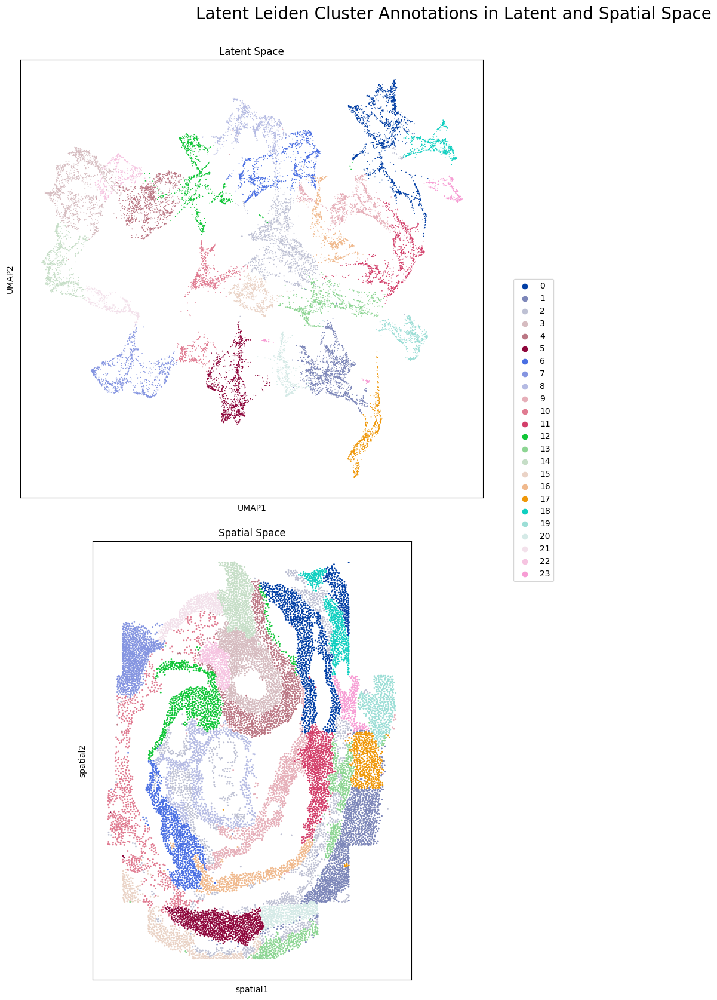

In [33]:
# Create subplot of latent Leiden cluster annotations in physical and latent space
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 20))
title = fig.suptitle(t="Latent Leiden Cluster Annotations in Latent and Spatial Space",
                     x=0.85,
                     y=0.925,
                     fontsize=20)
sc.pl.umap(adata=model.adata,
           color=[f"latent_leiden_{str(resolution)}"],
           title=f"Latent Space",
           ax=axs[0],
           show=False)
sc.pl.spatial(adata=model.adata,
              color=[f"latent_leiden_{str(resolution)}"],
              spot_size=0.03,
              title=f"Spatial Space",
              ax=axs[1],
              show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles, labels, bbox_to_anchor=(1.025, 0.7))
axs[0].get_legend().remove()
axs[1].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0, hspace=0.1)
fig.savefig(f"{figure_path}/{current_timestamp}/latent_leiden_cluster_annotations_in_latent_and_spatial_space.png",
            bbox_extra_artists=(lgd, title),
            bbox_inches="tight")
plt.show()

### 4.3 GP Enrichments

#### 4.3.1 Cell-type GP Enrichments

In [99]:
differential_gp_scores_key = "autotalker_cell_type_differential_gp_scores"
n_top_up_gps = 6
n_top_down_gps = 6

##### 4.3.1.1 Explore All GPs Across All Categories

In [100]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=None,
                                                      selected_cats=None,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [101]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Cardiomyocytes,CADM1_ligand_targetgenes_GP,0.997984,0.002016,6.204677
1,Cardiomyocytes,CDH11_ligand_targetgenes_GP,0.995117,0.004883,5.317017
2,Erythroid,EPOR_ligand_receptor_GP,0.992047,0.007953,4.826185
3,Erythroid,Glycine_metabolite_enzyme_sensor_GP,0.991326,0.008674,4.738683
4,Cardiomyocytes,BMP7_ligand_targetgenes_GP,0.989593,0.010407,4.554859
5,Presomitic mesoderm,CER1_ligand_receptor_GP,0.989433,0.010567,4.539407


In [102]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
10757,Cardiomyocytes,IGF1_ligand_targetgenes_GP,0.001000,0.999000,-6.906755
10756,Cardiomyocytes,PTDSS1_ligand_targetgenes_GP,0.008630,0.991370,-4.743893
10755,Presomitic mesoderm,Pyruvic acid_metabolite_enzyme_sensor_GP,0.012709,0.987291,-4.352624
10754,Presomitic mesoderm,IL17C_ligand_targetgenes_GP,0.015041,0.984959,-4.181806
10753,Cardiomyocytes,HMGB2_ligand_targetgenes_GP,0.018415,0.981585,-3.976027
10752,Cardiomyocytes,GDF6_ligand_targetgenes_GP,0.019120,0.980880,-3.937728


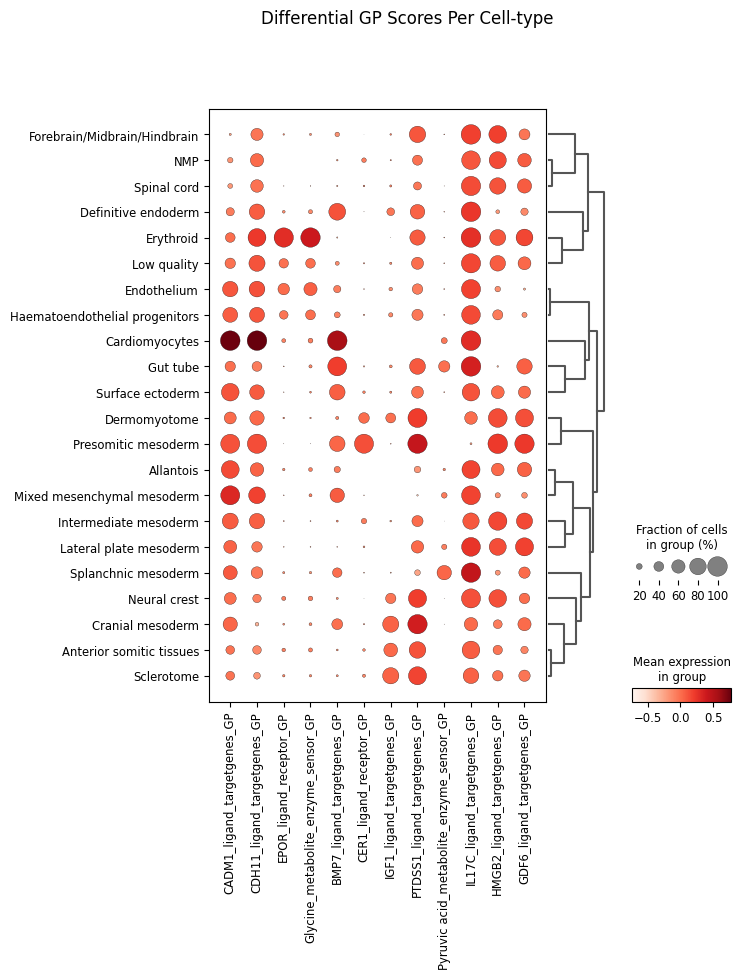

In [103]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/differential_gp_scores_per_cell_type_all_categories.png")
plt.show()

In [104]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

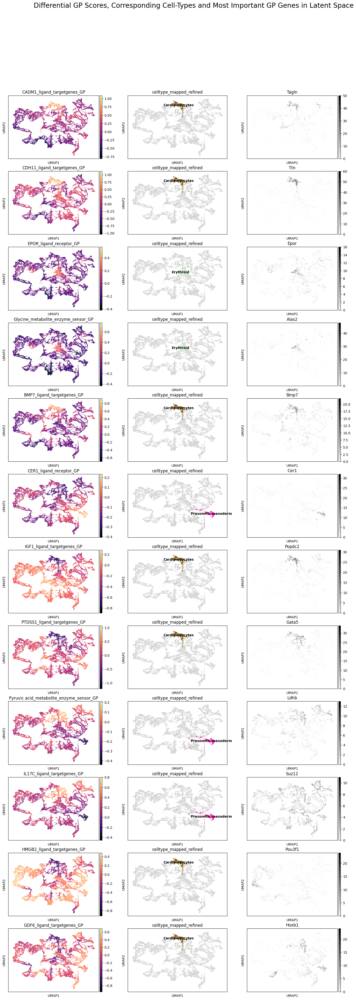

In [105]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/cell_type_gp_scores_cell_types_most_important_genes_all_categories.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

##### 4.3.1.2 Explore All GPs Across Specific Categories

In [111]:
selected_cats = ["Erythroid", "Cardiomyocytes"]

In [112]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=None,
                                                      selected_cats=selected_cats,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [113]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Cardiomyocytes,CADM1_ligand_targetgenes_GP,0.996577,0.003423,5.673851
1,Cardiomyocytes,CDH11_ligand_targetgenes_GP,0.995215,0.004785,5.337460
2,Cardiomyocytes,BMP7_ligand_targetgenes_GP,0.989180,0.010820,4.515522
3,Erythroid,Glycine_metabolite_enzyme_sensor_GP,0.985485,0.014515,4.217936
4,Erythroid,EPOR_ligand_receptor_GP,0.984953,0.015047,4.181414
5,Cardiomyocytes,NRP1_ligand_receptor_GP,0.982273,0.017727,4.014793


In [114]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
977,Cardiomyocytes,IGF1_ligand_targetgenes_GP,0.001002,0.998998,-6.904773
976,Cardiomyocytes,PTDSS1_ligand_targetgenes_GP,0.012963,0.987037,-4.332586
975,Cardiomyocytes,HMGB2_ligand_targetgenes_GP,0.016072,0.983928,-4.114462
974,Cardiomyocytes,GDF6_ligand_targetgenes_GP,0.018014,0.981986,-3.998399
973,Cardiomyocytes,LTF_ligand_targetgenes_GP,0.026706,0.973294,-3.595806
972,Cardiomyocytes,MPZ_ligand_targetgenes_GP,0.026940,0.973060,-3.586851


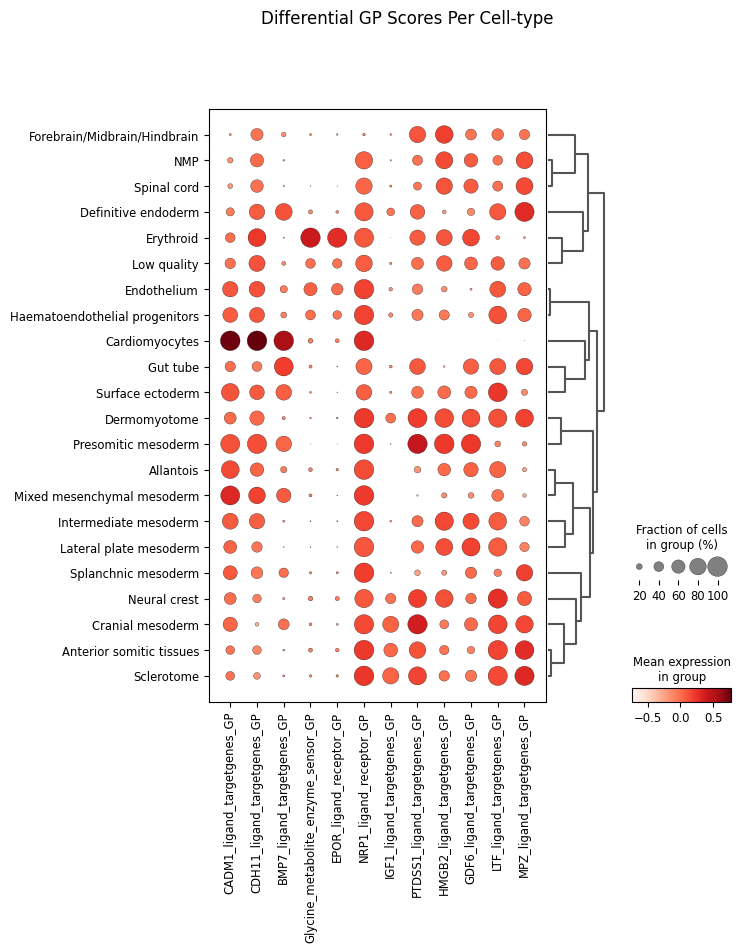

In [115]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/differential_gp_scores_per_cell_type_specific_categories.png")
plt.show()

In [116]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

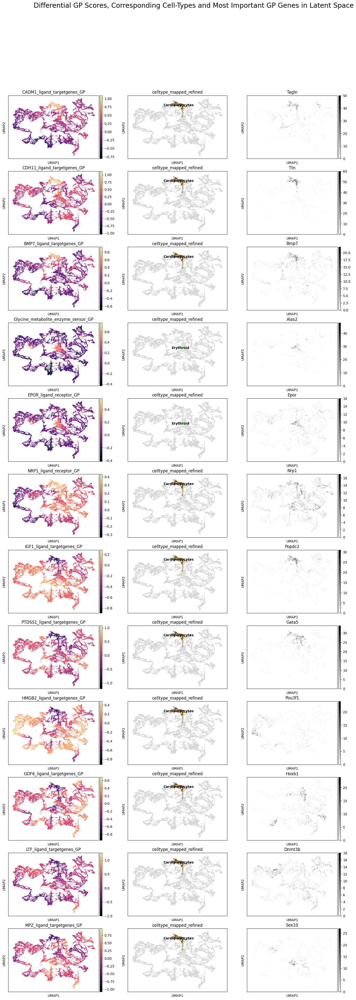

In [117]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/cell_type_gp_scores_cell_types_most_important_genes_specific_categories.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

##### 4.3.1.3 Explore Specific GPs

In [118]:
selected_gps = ["BMP7_ligand_targetgenes_GP", "EPOR_ligand_receptor_GP"]

In [119]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=selected_gps,
                                                      selected_cats=None,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [120]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Cardiomyocytes,BMP7_ligand_targetgenes_GP,0.618834,0.381166,0.484602
1,Erythroid,EPOR_ligand_receptor_GP,0.557388,0.442612,0.230567
2,Splanchnic mesoderm,BMP7_ligand_targetgenes_GP,0.535640,0.464360,0.142802
3,Gut tube,EPOR_ligand_receptor_GP,0.525570,0.474430,0.102371
4,Endothelium,EPOR_ligand_receptor_GP,0.522542,0.477458,0.090228
5,Spinal cord,EPOR_ligand_receptor_GP,0.517329,0.482671,0.069345


In [121]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
43,Cardiomyocytes,EPOR_ligand_receptor_GP,0.401384,0.598616,-0.399701
42,Splanchnic mesoderm,EPOR_ligand_receptor_GP,0.446185,0.553815,-0.216098
41,Lateral plate mesoderm,BMP7_ligand_targetgenes_GP,0.453126,0.546874,-0.188048
40,Presomitic mesoderm,EPOR_ligand_receptor_GP,0.459366,0.540634,-0.162895
39,Dermomyotome,EPOR_ligand_receptor_GP,0.468143,0.531857,-0.127602
38,Allantois,BMP7_ligand_targetgenes_GP,0.469947,0.530053,-0.120356


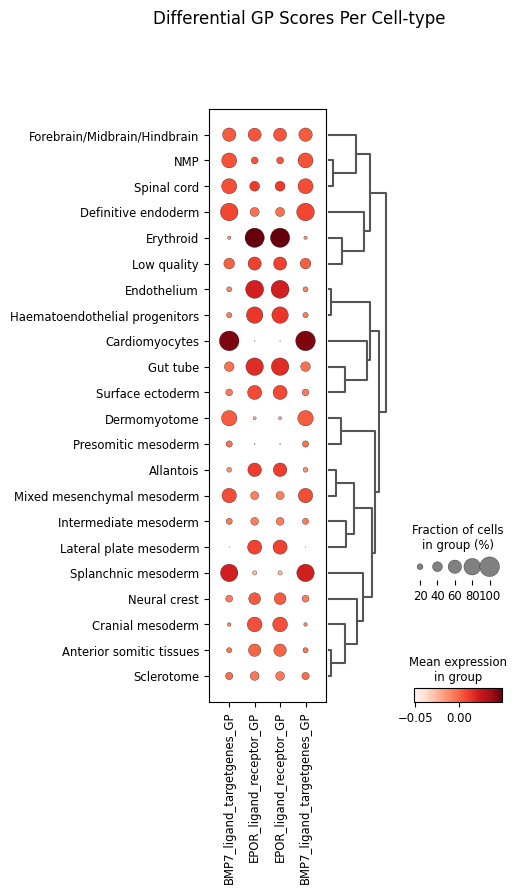

In [122]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/differential_gp_scores_per_cell_type_specific_gps.png")
plt.show()

In [123]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

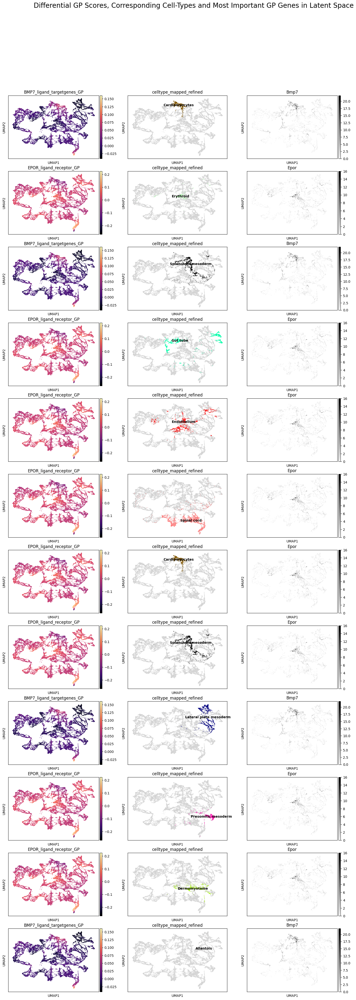

In [124]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/{current_timestamp}/cell_type_gp_scores_cell_types_most_important_genes_specific_gps.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

#### 4.3.2 Spatial GP Enrichments

Same analysis can be done with spatial cluster labels instead of cell-types.

#### 4.3.3 GP Gene Importances

In [125]:
selected_gp = ["BMP7_ligand_targetgenes_GP"]

In [126]:
gene_importances_df = model.compute_gp_gene_importances(
    selected_gp="BMP7_ligand_receptor_GP",
    adata=None)

display(gene_importances_df)

,gene,gene_entity,gene_weight_sign_corrected,gene_importance
0,Bmp7,source,0.032342,0.660092
1,Acvr1,target,0.016654,0.339908


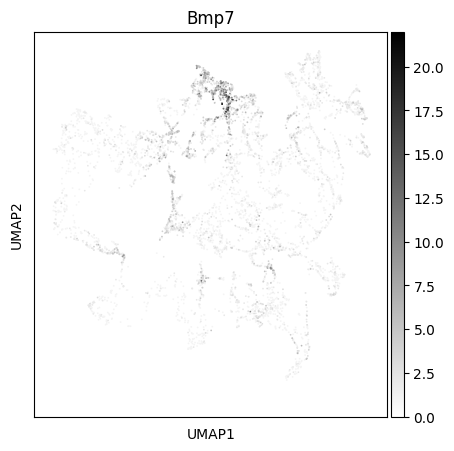

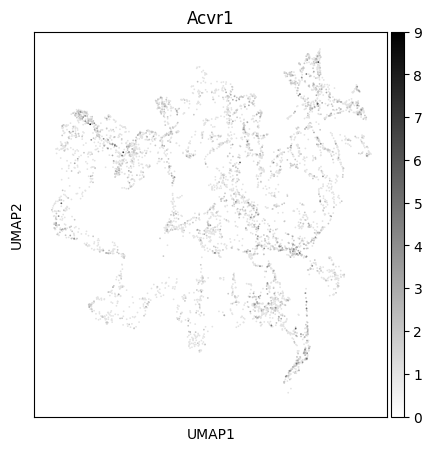

In [127]:
genes = list(gene_importances_df["gene"])

for gene in genes:
    sc.pl.umap(model.adata,
               color=gene,
               color_map="binary",
               legend_loc="on data",
               na_in_legend=False)

## 5. Learn De-Novo CCI GPs

### 5.1 Initialize, Train & Save Model

In [128]:
model = Autotalker.load(dir_path=f"{model_artifacts_path}/autotalker_combined_gps_{current_timestamp}",
                        adata=None,
                        adata_file_name=f"{dataset}.h5ad",
                        n_addon_gps=10,
                        gp_names_key=gp_names_key,
                        freeze_non_addon_weights=True)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 489, n_latent: 489, n_addon_latent: 10, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 489, n_addon_input: 10, n_output: 702


In [132]:
model.train(n_epochs=n_epochs,
            n_epochs_all_gps=n_epochs_all_gps,
            lr=lr,
            lambda_l1_addon=lambda_l1_addon)

--- INITIALIZING TRAINER ---
Number of training nodes: 17474
Number of validation nodes: 1942
Number of test nodes: 0
Number of training edges: 66019
Number of validation edges: 7766
Number of test edges: 3883

--- MODEL TRAINING ---
Epoch 1/10 |██------------------| 10.0% train_global_loss: 470.5896; train_optim_loss: 470.5896; val_global_loss: 471.8248; val_optim_loss: 471.8248
Epoch 2/10 |████----------------| 20.0% train_global_loss: 467.9156; train_optim_loss: 467.9156; val_global_loss: 471.4014; val_optim_loss: 471.4014
Epoch 3/10 |██████--------------| 30.0% train_global_loss: 468.4917; train_optim_loss: 468.4917; val_global_loss: 472.2659; val_optim_loss: 472.2659
Epoch 4/10 |████████------------| 40.0% train_global_loss: 468.8299; train_optim_loss: 468.8299; val_global_loss: 471.9414; val_optim_loss: 471.9414
Epoch 5/10 |██████████----------| 50.0% train_global_loss: 468.7754; train_optim_loss: 468.7754; val_global_loss: 471.2993; val_optim_loss: 471.2993
Epoch 6/10 |█████████

In [133]:
model.save(dir_path=f"{model_artifacts_path}/autotalker_combined_denovo_gps_{current_timestamp}",
           overwrite=True,
           save_adata=True,
           adata_file_name=f"{dataset}.h5ad")

Same analysis can be repeated with de-novo gene programs.